# PCA and Factor Analysis for JGB Yield Decomposition & Prediction (Part II)

## Table of Contents
<hr style="border: 0.25px solid black;">

- [5. Stacking Up Against Textbook Models](#section-5)  
  * [5.1 Nelson-Siegel Model](#subsection-51)
  * [5.2 Swensson Model](#subsection-52)
$$$$
- [6. Forecasting of 10-Year Treasury Yields](#section-6)
  * [6.1 Prediction Performance](#subsection-61)
  * [6.2 AutoRegressive Model](#subsection-62)
  * [6.3 1-Day Forward Value of 10-Year Treasury Yield as Y](#subsection-63)
  * [6.4 Ordinary Least Squares](#subsection-64)
  * [6.5 Recursive Feature Elimination](#subsection-65)
  * [6.6 L2 & L1 Regularization](#subsection-66)

## 5. Stacking Up Against Textbook Models
<a id="section-5"></a>
<hr style="border: 0.25px solid black;">

### 5.1 Nelson-Siegel Model 
<a id="subsection-51"></a>

$$y(\tau) = \beta_0 + \beta_1 \frac{1 - e^{-\lambda \tau}}{\lambda \tau} + \beta_2 \left(\frac{1 - e^{-\lambda \tau}}{\lambda \tau} - e^{-\lambda \tau}\right)$$

$\text{Where :}$
- $ y(\tau) \text{ is the yield for a given maturity $\tau$} $.
- $ \beta_0 \text{ represents the long-term level of the yield curve.} $
- $ \beta_1 \text{ controls the slope of the yield curve.} $
- $ \beta_2 \text{ controls the curvature of the yield curve.} $
- $ \lambda \text{ is the decay factor that controls the exponential decay of the slope and curvature components.} $

In [84]:
ns_maturities = np.array([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 15, 20, 25, 30])
ns_initial_guesses = [1.0, -1.0, 1.0, 1.0]

In [85]:
def nelson_siegel_yield(maturities, beta0, beta1, beta2, lambda_) :
    """
    Arguments :
    - maturities : list of int for maturities
    - beta : float for the level parameter 
    - beta1 : float for the slope parameter 
    - beta2 : float for the curvature parameter 
    - lambda_ : float for the decay factor parameter 
    
    Returns :
    - yield_val : float for the Nelson-Siegel yield value 
    
    Function :
    - Computes the 3 terms using the input parameters, as specified by the model 
    - Computes their sum 
    """
    term1 = beta0
    term2 = beta1 * (1 - np.exp(-maturities / lambda_)) / (maturities / lambda_)
    term3 = beta2 * ((1 - np.exp(-maturities / lambda_)) / (maturities / lambda_) - np.exp(-maturities / lambda_))
    yield_val = term1 + term2 + term3 
    return yield_val 

In [86]:
def nelson_siegel_reconstruct(observed_yields_df, maturities, initial_guesses) :
    """
    Arguments :
    - observed_yields_df : 
    - maturities : list of int for maturities
    - initial_guesses : list of float for the initial guess values 
    
    Returns :
    - reconstr_yields_df : DataFrame for the Nelson-Siegel reconstructed yields 
    
    Function :
    - Estimates the Nelson-Siegel model parameters that would optimize the nelson_siegel_yield function, 
      aka output yield values as close to actual yield values as possible for each maturity 
    """
    ns_params_df = pd.DataFrame(index = observed_yields_df.index, columns = ["beta0", "beta1", "beta2", "lambda"])
    reconstr_yields_df = pd.DataFrame(index = observed_yields_df.index, columns = observed_yields_df.columns) 
    
    for date in observed_yields_df.index :
        yields_vals = observed_yields_df.loc[date].values

        try :
            params, _ = sp.optimize.curve_fit(nelson_siegel_yield, maturities, yields_vals, p0 = initial_guesses)
            ns_params_df.loc[date] = params
        
        except RuntimeError :
            ns_params_df.loc[date] = [np.nan] * 4
        
        beta0, beta1, beta2, lambda_ = params 
        reconstr_yields_df.loc[date] = nelson_siegel_yield(maturities, beta0, beta1, beta2, lambda_)
    
    plt.figure(figsize = (12, 7))

    for param in ns_params_df.columns :
        plt.plot(ns_params_df.index, ns_params_df[param], label = param)
    
    plt.ylabel(f"Nelson-Siegel Parameter Value", fontsize = 12)
    plt.legend( )
    plt.style.use("default")
    plt.show( )
    
    return reconstr_yields_df 

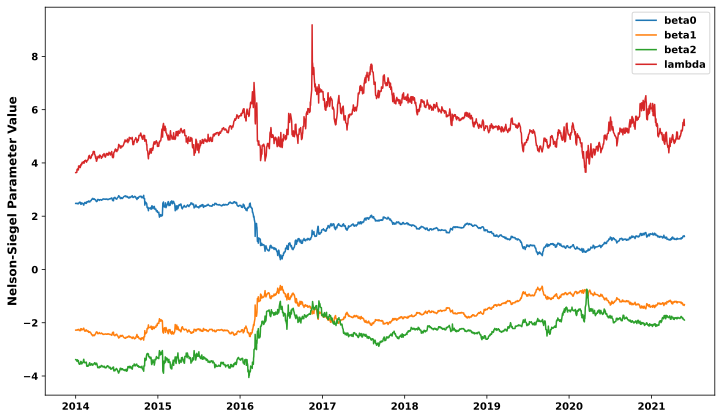

In [87]:
ns_yields_train = nelson_siegel_reconstruct(yields_train, ns_maturities, ns_initial_guesses) 

        R^2  Adjusted R^2
1Y  92.7340       92.6810
2Y  98.5433       98.5327
3Y  94.8375       94.7998
4Y  95.0284       94.9921
5Y  97.7298       97.7132
6Y  99.5141       99.5105
7Y  98.2218       98.2088
8Y  98.5904       98.5801
9Y  99.1493       99.1431
10Y 99.0368       99.0298
15Y 99.5352       99.5318
20Y 97.3942       97.3752
25Y 99.8906       99.8898
30Y 99.1708       99.1647


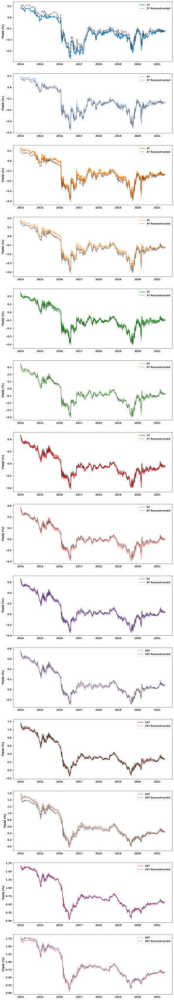

In [88]:
eval_fit(yields_train, ns_yields_train)

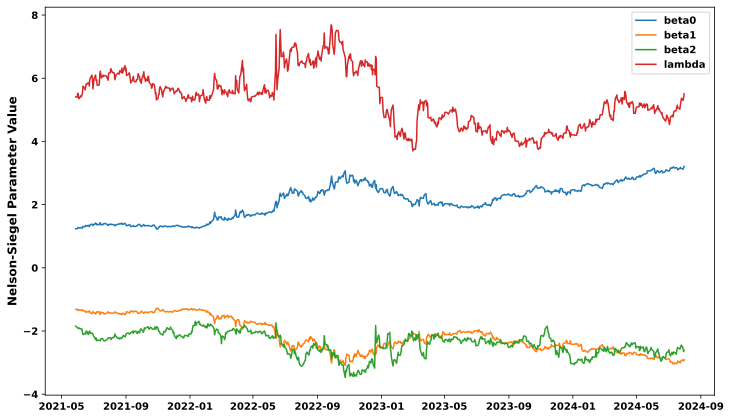

In [89]:
ns_yields_test = nelson_siegel_reconstruct(yields_test, ns_maturities, ns_initial_guesses) 

        R^2  Adjusted R^2
1Y  85.2629       85.0095
2Y  94.4790       94.3840
3Y  98.9174       98.8988
4Y  99.1329       99.1180
5Y  97.9439       97.9085
6Y  99.2561       99.2433
7Y  99.1531       99.1385
8Y  99.2946       99.2825
9Y  99.0788       99.0630
10Y 96.5135       96.4536
15Y 99.5579       99.5503
20Y 99.0074       98.9903
25Y 99.9470       99.9461
30Y 99.5178       99.5095


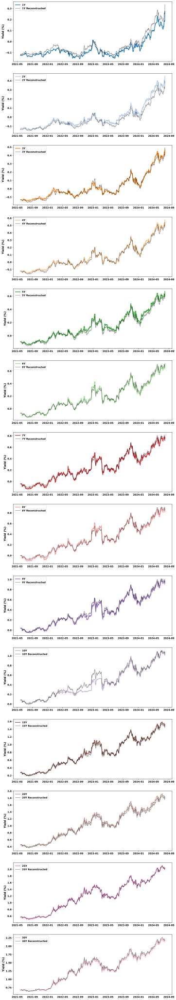

In [90]:
eval_fit(yields_test, ns_yields_test)

### 5.2 Swensson Model 
<a id="subsection-52"></a>

$$y(\tau) = \beta_0 + \beta_1 \frac{1 - e^{-\lambda_1 \tau}}{\lambda_1 \tau} + \beta_2 \left(\frac{1 - e^{-\lambda_1 \tau}}{\lambda_1 \tau} - e^{-\lambda_1 \tau}\right) + \beta_3 \left(\frac{1 - e^{-\lambda_2 \tau}}{\lambda_2 \tau} - e^{-\lambda_2 \tau}\right)$$

$\text{Where :}$
- $ y(\tau) \text{ is the yield for a given maturity $\tau$.} $
- $ \beta_0 \text{ represents the long-term level of the yield curve.} $
- $ \beta_1 \text{ controls the slope of the yield curve.} $
- $ \beta_2 \text{ and } \beta_3 \text{ control the curvature of the yield curve.} $
- $ \lambda_1 \text{ and } \lambda_2 \text{ are decay factors that control the exponential decay of the slope and curvature components.} $

In [91]:
sw_maturities = np.array([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 15, 20, 25, 30])
sw_initial_guesses = [1.0, -0.1, 1.0, -0.1, 1.0, 1.0]

In [92]:
def swensson_yield(maturities, beta0, beta1, beta2, beta3, lambda1, lambda2) :
    """
    Arguments :
    - maturities : list of int for maturities
    - beta : float for the level parameter 
    - beta1 : float for the slope parameter 
    - beta2 : float for the first curvature parameter 
    - beta3 : float for the second curvature parameter 
    - lambda1 : float for the first decay factor parameter 
    - lambda2 : float for the second decay factor parameter 
    
    Returns :
    - yield_val : float for the Swensson yield value 
    
    Function :
    - Computes the 4 terms using the input paramters, as specified by the model 
    - Computes their sum 
    """
    term1 = beta0
    term2 = beta1 * (1 - np.exp(-maturities / lambda1)) / (maturities / lambda1)
    term3 = beta2 * ((1 - np.exp(-maturities / lambda1)) / (maturities / lambda1) - np.exp(-maturities / lambda1))
    term4 = beta3 * ((1 - np.exp(-maturities / lambda2)) / (maturities / lambda2) - np.exp(-maturities / lambda2))
    return term1 + term2 + term3 + term4

In [93]:
def swensson_reconstruct(observed_yields_df, maturities, initial_guesses) :
    """
    Arguments :
    - observed_yields_df : 
    - maturities : list of int for maturities
    - initial_guesses : list of float for the initial guess values 
    
    Returns :
    - reconstr_yields_df : DataFrame for the Swensson reconstructed yields  
    
    Function :
    - Estimates the Swensson model parameters that would optimize the swensson_yield function, 
      aka output yield values as close to actual yield values as possible for each maturity 
    """     
    sw_params_df = pd.DataFrame(index = observed_yields_df.index, columns = ["beta0", "beta1", "beta2", "beta3", "lambda1", "lambda2"])
    reconstr_yields_df = pd.DataFrame(index = observed_yields_df.index, columns = observed_yields_df.columns) 
    
    for date in observed_yields_df.index :
        yields_vals = observed_yields_df.loc[date].values

        try :
            params, _ = sp.optimize.curve_fit(swensson_yield, maturities, yields_vals, p0 = initial_guesses)
            sw_params_df.loc[date] = params
        
        except RuntimeError :
            sw_params_df.loc[date] = [np.nan] * 6
        
        beta0, beta1, beta2, beta3, lambda1, lambda2 = params 
        reconstr_yields_df.loc[date] = swensson_yield(maturities, beta0, beta1, beta2, beta3, lambda1, lambda2)
    
    return reconstr_yields_df

In [94]:
sw_yields_train = swensson_reconstruct(yields_train, sw_maturities, sw_initial_guesses) 

        R^2  Adjusted R^2
1Y  79.8244       79.6770
2Y  88.5132       88.4293
3Y  92.2613       92.2048
4Y  92.6190       92.5651
5Y  92.5362       92.4817
6Y  92.1728       92.1156
7Y  91.0968       91.0318
8Y  93.0638       93.0132
9Y  94.9338       94.8968
10Y 95.6951       95.6637
15Y 97.7609       97.7445
20Y 95.4291       95.3957
25Y 97.3942       97.3752
30Y 96.9472       96.9249


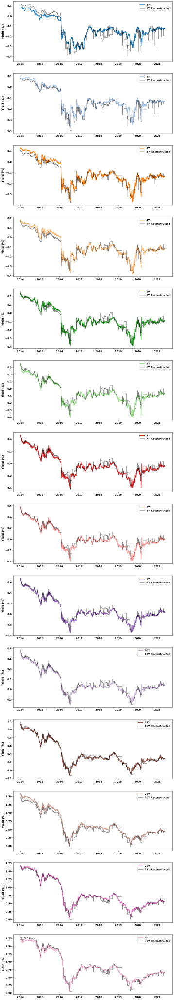

In [95]:
eval_fit(yields_train, sw_yields_train)

In [96]:
sw_yields_test = swensson_reconstruct(yields_test, sw_maturities, sw_initial_guesses) 

        R^2  Adjusted R^2
1Y  75.1498       74.7224
2Y  92.3229       92.1909
3Y  98.6470       98.6237
4Y  98.7785       98.7574
5Y  97.1448       97.0957
6Y  98.0780       98.0449
7Y  97.9536       97.9184
8Y  98.2934       98.2641
9Y  98.3825       98.3547
10Y 96.0300       95.9617
15Y 99.3969       99.3866
20Y 98.6476       98.6243
25Y 99.5974       99.5905
30Y 99.0430       99.0265


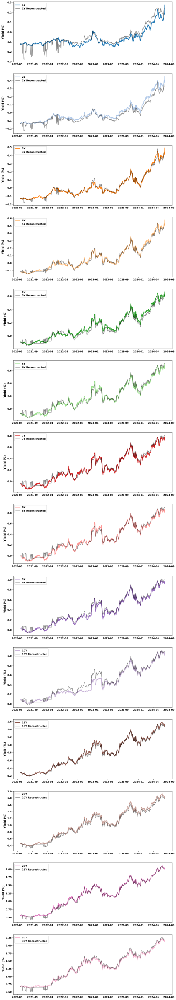

In [97]:
eval_fit(yields_test, sw_yields_test)

## 6. Forecasting of 10-Year Treasury Yields 
<a id="section-6"></a>
<hr style="border: 0.25px solid black;">

### 6.1 Prediction Performance 
<a id="subsection-61"></a>

$$\text{Mean Squared Error} = \frac{1}{n} \sum_{i=1}^{n} (y_i - \hat{y_i})^2$$

$$\text{Relative Squared Error} = \frac{\sum_{i=1}^{n} (y_i - \hat{y}_i)^2}{\sum_{i=1}^{n} (y_i - \bar{y})^2}$$

$$\text{Mean Absolute Error} = \frac{1}{n} \sum_{i=1}^{n} |y_i - \hat{y}_i|$$

$$\text{Relative Absolute Error} = \frac{\sum_{i=1}^{n} | y_i - \hat{y}_i |}{\sum_{i=1}^{n} | y_i - \bar{y} |}$$

$$\text{Mean Absolute Percentage Error} = \frac{100}{n} \sum_{i=1}^{n} \left| \frac{y_i - \hat{y}_i}{y_i} \right|$$

$$\text{Symmetric Mean Asolute Percentage Error} = \frac{100}{n} \sum_{i=1}^{n} \frac{| y_i - \hat{y}_i |}{\frac{| y_i | + | \hat{y}_i |}{2}}$$

$$\text{Tracking Signal} = \frac{\sum_{i=1}^{n} (y_i - \hat{y}_i)}{\text{MAE}}$$

$$\text{Aikake Information Criterion} = n \times \log\left(\frac{\sum_{i=1}^{n} (y_i - \hat{y}_i)^2}{n}\right) + 2 \times p$$

$$\text{Bayesian Information Criterion} = n \times \log\left(\frac{\sum_{i=1}^{n} (y_i - \hat{y}_i)^2}{n}\right) + p \times \log(n)$$

$\text{Where :}$
- $ n \text{ is the number of observations.} $
- $ p \text{ is the number of features.} $
- $ y_i \text{ is the observed actual outcome for the $i$-th observation.} $
- $ \hat{y_i} \text{ is the predicted outcome for the $i$-th observation.} $

In [98]:
def compute_metrics(Y_obs, Y_hat) :
    """
    Arguments :
    - Y_obs : Series for the observed response variable values 
    - Y_hat : Series for the predicted response variable values 
    
    Returns :
    - metrics : list of 10 regression & time series metrics 
    
    Function :
    - Computes the mean squared error, relative mean squared error, mean absolute error, relative absolute error, 
      symetric mean absolute percentage error, tracking signal, and aikake & bayesian information criteria
    """
    mse = metrics.mean_squared_error(Y_obs, Y_hat)
    rse = np.sum((Y_obs - Y_hat) ** 2) / np.sum((Y_obs - np.mean(Y_obs)) ** 2)
    mae = metrics.mean_absolute_error(Y_obs, Y_hat)
    rae = np.sum(np.abs(Y_obs - Y_hat)) / np.sum(np.abs(Y_obs - np.mean(Y_obs)))
    smape = 100 / len(Y_obs) * np.sum(2 * np.abs(Y_hat - Y_obs) / (np.abs(Y_obs) + np.abs(Y_hat)))
    rmse = metrics.mean_squared_error(Y_obs, Y_hat, squared = False)
    ts = np.sum(Y_obs - Y_hat) / mae
    r2 = metrics.r2_score(Y_obs, Y_hat)
    adj_r2 = 1 - ((1 - r2) * (len(Y_obs) - 1) / (len(Y_obs) - 3 - 1))
    
    residuals = Y_obs - Y_hat 
    sse = np.sum(residuals ** 2)
    aic = len(Y_obs) * np.log(sse / len(Y_obs)) + 2 * 3
    bic = len(Y_obs) * np.log(sse / len(Y_obs)) + 3 * np.log(len(Y_obs))
    
    reg_metrics = [mse, rse, mae, rae, smape, rmse, ts, adj_r2, aic, bic]
    return reg_metrics 

In [99]:
def eval_reg(Y_test, Y_test_pred, Y_train, Y_train_pred) :
    """
    Arguments :
    - Y_test : Series for the observed response variable values in the test set  
    - Y_test_pred : Series for the predicted response variable values in the test set  
    - Y_train : Series for the observed response variable values in the training set 
    - Y_train_pred : Series for the predicted response variable values in the training set 
    
    Returns :
    - metrics_df : DataFrame for the regression & time series metrics for in-sample and out-of-sample evaluation 
    
    Function :
    - Uses the compute_metrics function to compute the regression & time series metrics for both training and test data 
    - Draws line plots for true vs predicted Y values (on both training and test sets)
    - Draws kernel density plots for true vs predicted Y values  
    - Draws a bar chart of the RMSE for predictions in each year  
    - Draws a scatter plot for true vs predicted Y values 
    - Draws a line plot of residuals 
    - Draws box & whisker plots for residuals on training and test predictions 
    """
    test_metrics = compute_metrics(Y_test, Y_test_pred)
    train_metrics = compute_metrics(Y_train, Y_train_pred)
    
    metrics_df = pd.DataFrame({"Test": test_metrics, "Train": train_metrics}, 
                              index = ["MSE", "RSE", "MAE", "RAE", "sMAPE", "RMSE", "TS", "Adj R^2", "AIC", "BIC"])
    
    fig, ax = plt.subplots(figsize = (12, 35), nrows = 7, ncols = 1)
    Y_pred = pd.concat([Y_train_pred, Y_test_pred], axis = 0)
    Y_true = pd.concat([Y_train, Y_test], axis = 0)
    index = Y_train.index.append(Y_test.index)
    
    ax[0].plot(Y_train_pred, color = "tab:blue", linewidth = 1.0, label = "Predicted (Training)")
    ax[0].plot(Y_train, color = "tab:green", linewidth = 1.0, label = "Observed (Training)")
    ax[0].set_ylabel("Yield (%)", fontsize = 12)
    ax[0].legend( )
    
    ax[1].plot(Y_test_pred, color = "tab:blue", linewidth = 1.0, label = "Predicted (Test)")
    ax[1].plot(Y_test, color = "tab:green", linewidth = 1.0, label = "Observed (Test)")
    ax[1].set_ylabel("Yield (%)", fontsize = 12)
    ax[1].legend( )
    
    sns.kdeplot(x = Y_pred, ax = ax[2], color = "tab:blue", label = "Predicted")
    sns.kdeplot(x = Y_true, ax = ax[2], color = "tab:green", label = "Observed")
    ax[2].set_xlabel("Yield (%)", fontsize = 12)
    ax[2].set_ylabel("Density", fontsize = 12)
    ax[2].legend( )
    
    rmse_by_year = [  ]
    for year in np.unique(index.year) :
        rmse = metrics.mean_squared_error(Y_true.loc[str(year)], Y_pred.loc[str(year)], squared = False)
        rmse_by_year.append(rmse)  
    rmse_by_year = pd.Series(rmse_by_year, index = np.unique(index.year)).T 
    
    ax[3].bar(x = np.unique(index.year), height = rmse_by_year, width = 0.5, color = "tab:orange")
    ax[3].set_xticks(ticks = np.unique(index.year))
    ax[3].set_ylabel("RMSE (%)", fontsize = 12)
    
    ax[4].scatter(Y_pred, Y_true, color = "black", s = 10, alpha = 0.5)
    ax[4].set_xlabel("Predicted Yield (%)", fontsize = 12)
    ax[4].set_ylabel("Observed Yield (%)", fontsize = 12)
    
    residuals = Y_true - Y_pred
    ax[5].plot(residuals, color = "tab:red", alpha = 0.7)
    ax[5].set_ylabel("Residuals (%)", fontsize = 12)
    
    ax[6].scatter(Y_pred, residuals, color = "tab:purple", s = 10, alpha = 0.5)
    ax[6].set_xlabel("Fitted (%)", fontsize = 12)
    ax[6].set_ylabel("Residuals (%)", fontsize = 12)
    
    plt.style.use("default")
    plt.show( )
    
    resids_train = Y_train - Y_train_pred
    resids_test = Y_test - Y_test_pred 
    
    plt.figure(figsize = (12, 2))    
    for i, resids in enumerate([resids_train, resids_test]) :
        
        box = plt.boxplot(resids, positions = [i], widths = 0.5, vert = False)
        for median in box["medians"] :
            median.set_color("black")
    
    plt.yticks([0, 1], ["Train", "Test"])
    plt.xlabel("Residuals", fontsize = 12)
    plt.style.use("default")
    plt.show( )
    
    return metrics_df

### 6.2 AutoRegressive Model
<a id="subsection-62"></a>

$$y_t = c + \phi_1 y_{t-1} + \phi_2 y_{t-2} + \dots + \phi_p y_{t-p} + \epsilon_t$$

$\text{Where :}$
- $ y_t \text{ is the value of the time series at time $t$.} $
- $ c \text{ is a constant term (intercept).} $
- $ \phi_1, \phi_2, \dots, \phi_p \text{ are the coefficients of the model.} $
- $ \epsilon_t \text{ is the error term at time $t$.} $

In [100]:
def plot_autocorr(ts, max_lags) :
    """
    Arguments :
    - ts : Series containing the time series on which to compute autocorrelation and partial autocorrelation 
    - max_lags : int representing the maximum number of lags on which to compute autocorrelation and partial autocorrelation  
    
    Returns :
    - None 
    
    Function :
    - Plots correlation between the time series and its lagged value for lags from 1 to max_lags 
    - Plots correlation between the time series and its lagged value for lags from 1 to max_lags 
    """
    fig, ax = plt.subplots(nrows = 2, ncols = 1, figsize = (12, 10))
    
    tsaplots.plot_pacf(x = ts, lags = max_lags, zero = False, ax = ax[0])
    ax[0].set_title("")
    ax[0].set_xlabel("Number of Lags", fontsize = 12)
    ax[0].set_ylabel("Partial Autocorrelation", fontsize = 12, c = "red")
    ax[0].set_xticks(ticks = range(1, max_lags + 1))
    #ax[0].set_ylim((-0.1, 1))
    ax[0].grid( )
    
    tsaplots.plot_acf(x = ts, lags = max_lags, zero = False, ax = ax[1])
    ax[1].set_title("")
    ax[1].set_xlabel("Number of Lags", fontsize = 12)
    ax[1].set_ylabel("Autocorrelation", fontsize = 12, c = "red")
    ax[1].set_xticks(ticks = range(1, max_lags + 1))
    #ax[1].set_ylim((-0.1, 1))
    ax[1].grid( )
    
    plt.style.use("default")
    plt.show( )

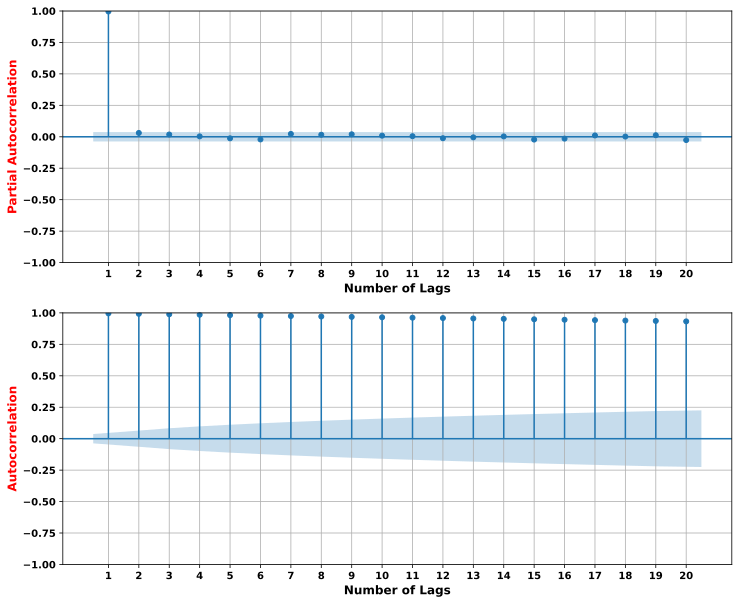

In [101]:
plot_autocorr(jgb_yields["10Y"], 20)

In [102]:
def fit_auto_reg(ts, p) :
    """
    Arguments :
    - ts : Series containing the time series on which to conduct autoregression 
    - p : int representing the lag order 
    
    Returns :
    - Y_ar_p : Series containing the AR(p) model's predicted values 
    
    Function :
    - Fits an autoregressive model of lag p with constant trend on the time series 
    - Prints the model parameters 
    """
    ar_p = ar_model.AutoReg(endog = ts, lags = p, trend = "c").fit( )
    print(ar_p.summary( ))
    
    Y_ar_p = ar_p.predict(start = 1, end = len(ts) - 1, dynamic = False)
    return Y_ar_p

In [103]:
fit_auto_reg(jgb_yields["10Y"], 1)

                            AutoReg Model Results                             
Dep. Variable:                    10Y   No. Observations:                 2761
Model:                     AutoReg(1)   Log Likelihood                7430.512
Method:               Conditional MLE   S.D. of innovations              0.016
Date:                Fri, 13 Sep 2024   AIC                         -14855.024
Time:                        13:09:21   BIC                         -14837.255
Sample:                    01-02-2014   HQIC                        -14848.606
                         - 07-31-2024                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0003      0.000      0.658      0.510      -0.001       0.001
10Y.L1         0.9994      0.001    910.787      0.000       0.997       1.002
                                    Roots           

Date
2014-01-02   0.7358
2014-01-03   0.7358
2014-01-06   0.7358
2014-01-07   0.7248
2014-01-08   0.6958
              ...  
2024-07-25   1.0836
2024-07-26   1.0776
2024-07-29   1.0676
2024-07-30   1.0406
2024-07-31   1.0116
Freq: B, Length: 2760, dtype: float64

### 6.3 1-Day Forward Value of 10-Year Treasury Yield as Y  
<a id="subsection-63"></a>

**Explanatory Features**
- 1-Day Change in the Level, Slope, and Curvature scores 
- 1-Day Change in the 10-Year Spread, USDJPY cross rates, and Nikkei 225

In [104]:
X = svd_pc_scores.diff(1).dropna( ) 
X["10Y"] = jgb_yields["10Y"].loc[X.index]
X[[".U-J10YRS G", "USDJPY", "NKY"]] = related_feats[[".U-J10YRS G", "USDJPY", "NKY"]].diff(1).dropna( )

In [105]:
X

,Level,Slope,Curvature,10Y,.U-J10YRS G,USDJPY,NKY
Date,,,,,,,
2014-01-02,0.0000,0.0000,0.0000,0.7360,-3.9116,-0.4400,0.0000
2014-01-03,0.0000,0.0000,0.0000,0.7360,0.5759,0.0500,0.0000
2014-01-06,-0.1820,-0.0015,0.0786,0.7250,-2.3176,-0.6400,-382.4300
2014-01-07,-0.2673,0.0721,0.1301,0.6960,1.1478,0.3800,-94.5100
2014-01-08,0.0181,0.0108,-0.0559,0.7010,3.9273,0.2600,307.0800
...,...,...,...,...,...,...,...
2024-07-25,0.2613,0.4068,-0.0693,1.0780,-2.1050,0.0500,-1285.3400
2024-07-26,-0.0929,0.0902,0.0124,1.0680,-5.4871,-0.1800,-202.1000
2024-07-29,-0.4493,-0.0641,0.1498,1.0410,2.0525,0.2600,801.2200


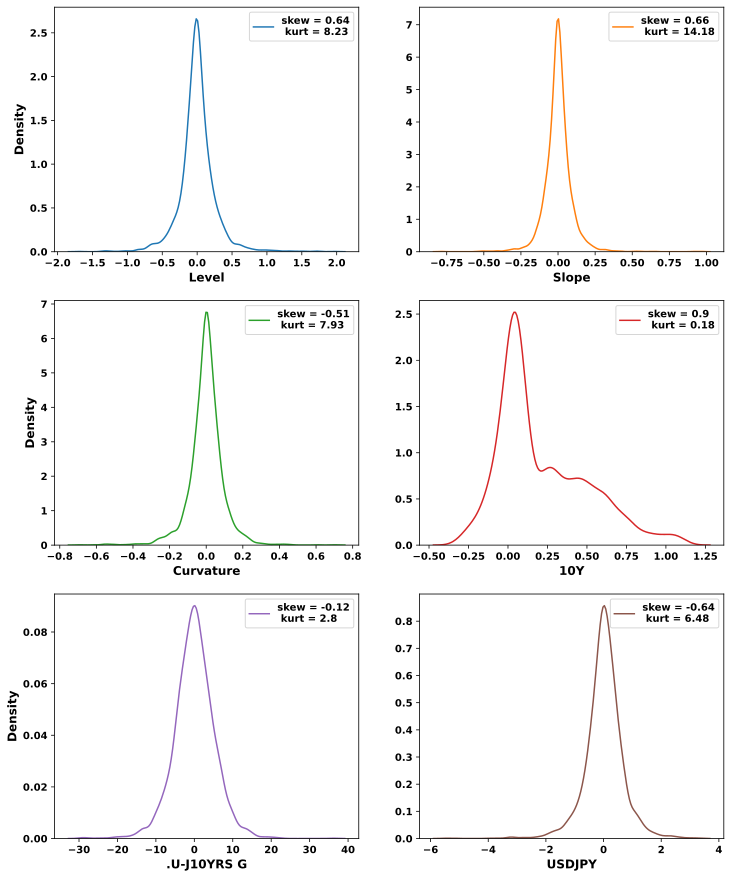

In [106]:
plot_kde(X)

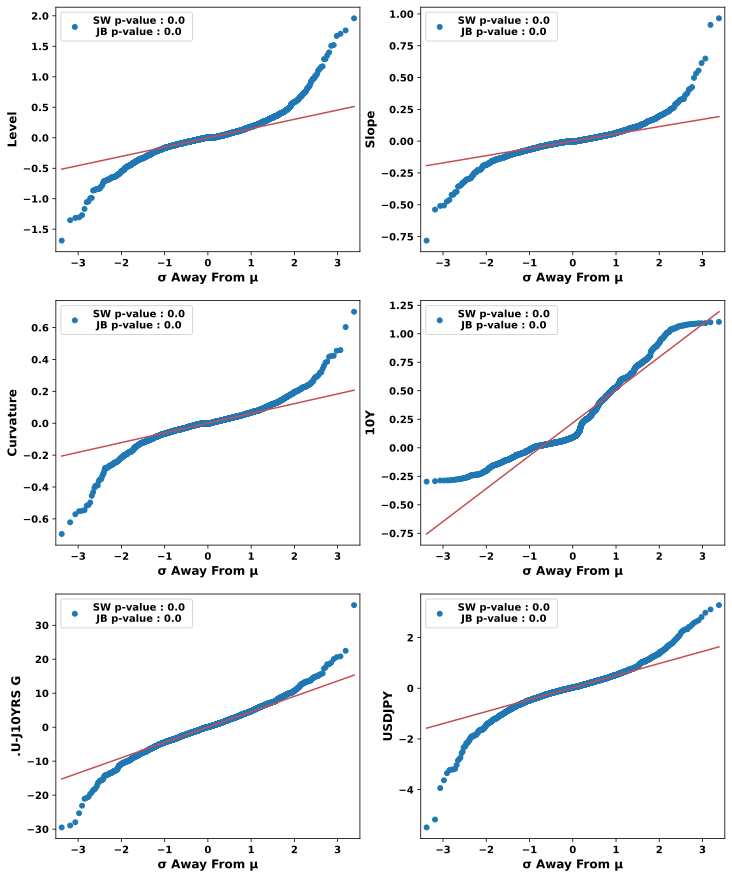

In [107]:
plot_qq(X)

In [108]:
def lagged_Y(Y, n_days) :
    """
    Arguments :
    - Y : Series for the response variable values  
    - n_days : int for the number of days by which to switch the input response variable forward 
    
    Returns :
    - Y_lagged : Series for the response variable values shifted forward by n_days 
    """
    Y_lagged = Y.shift(-n_days).dropna( )
    Y_lagged.name = Y_lagged.name + "_pred"
    return Y_lagged 

In [109]:
y_reg = lagged_Y(jgb_yields["10Y"].loc[X.index], 1) 

In [110]:
y_reg

Date
2014-01-02   0.7360
2014-01-03   0.7250
2014-01-06   0.6960
2014-01-07   0.7010
2014-01-08   0.6960
              ...  
2024-07-24   1.0780
2024-07-25   1.0680
2024-07-26   1.0410
2024-07-29   1.0120
2024-07-30   1.0700
Freq: B, Name: 10Y_pred, Length: 2759, dtype: float64

In [111]:
X = X.loc[y_reg.index] 

In [112]:
def plot_xy_relationship(X_df, Y) : 
    """
    Arguments :
    - X_df : DataFrame for the unscaled explanatory variables' values 
    - Y : Series for the response variable values 
    
    Returns :
    - None 
    
    Function :
    - Draws a scatter plot and a regression line between each explanatory feature and the response feature 
    """
    fig, ax = plt.subplots(figsize = (12, X_df.shape[1] * 5), nrows = X_df.shape[1], ncols = 1)
    colors = sns.color_palette("tab10")

    for i, feature in enumerate(X_df.columns) :
        color = colors[i]
        sns.regplot(x = X_df[feature], y = Y, ci = 95, color = color, scatter_kws = {"alpha" : 0.1}, ax = ax[i])
        
        ax[i].set_xlabel(feature, fontsize = 12)
        ax[i].set_ylabel(Y.name, fontsize = 12)

    plt.style.use("default") 
    plt.show( )

In [113]:
plot_xy_relationship(X, y_reg)

The **Granger Causality Test** is based on comparing two models :
$$$$
1. **Restricted Model** (without lagged values of the cause)
   > $Y_t = \alpha_0 + \alpha_1 Y_{t-1} + \alpha_2 Y_{t-2} + \cdots + \alpha_p Y_{t-p} + \epsilon_t$

2. **Unrestricted Model** (with lagged values of the cause)
   > $Y_t = \beta_0 + \beta_1 Y_{t-1} + \beta_2 Y_{t-2} + \cdots + \beta_p Y_{t-p} + \gamma_1 X_{t-1} + \gamma_2 X_{t-2} + \cdots + \gamma_p X_{t-p} + \epsilon_t$

$\text{Where :}$
- $ Y_t \text{ is the dependent variable at time \(t\).} $
- $ X_t \text{ is the independent variable at time \(t\).} $
- $ p \text{ is the number of lags.} $
- $ \alpha_i, \beta_i, and \gamma_i \text{ are parameters to be estimated.} $
- $ \epsilon_t \text{ is the error term.} $

- **Null Hypothesis ($H_0$)** : The lagged values of $X$ do not Granger-cause $Y$. The coefficients $\gamma_i$ are all zero.
- **Alternative Hypothesis ($H_1$)** : The lagged values of $X$ do Granger-cause $Y$. At least one $\gamma_i \neq 0$.)
$$$$
$$F = \frac{(RSS_{restricted} - RSS_{unrestricted}) / m}{RSS_{unrestricted} / (T - 2m)}$$

$\text{Where :}$
- $ RSS_{restricted} \text{ is the residual sum of squares of the restricted model.} $
- $ RSS_{unrestricted} \text{ is the residual sum of squares of the unrestricted model.} $
- $ m \text{ is the number of restrictions (lags).} $
- $ T \text{ is the number of observations.} $

The F-statistic follows an F-distribution with $m$ and $T - 2m$ degrees of freedom. A large F-statistic suggests that the unrestricted model explains significantly more variation in $Y$ compared to the restricted model. Lagged values of $X$ significantly improve the prediction of $Y$, leading to rejection of the null hypothesis.

In [114]:
def test_causality(ts1, ts2, max_lags = 5) :
    """
    Arguments :
    - ts1 : Series containing the time series which is tested to be caused (dependent variable)
    - ts2 : Series containing the time series which is tested as the cause (independent variable)
    - max_lags : int for the maximum number of lags of ts2 to test causality to ts1 
    
    Returns :
    - None 
    
    Function :
    - Conducts the Granger Causality test to determine whether there is lagged causal relationship between ts1 and ts2  
    """
    ts_df = pd.concat([ts1, ts2], axis = 1)
    ts_df.columns = ["series1", "series2"]

    results = stattools.grangercausalitytests(ts_df[["series1", "series2"]], maxlag = max_lags, verbose = True)

In [115]:
test_causality(y_reg, X["Level"])


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.7918  , p=0.0287  , df_denom=2755, df_num=1
ssr based chi2 test:   chi2=4.7970  , p=0.0285  , df=1
likelihood ratio test: chi2=4.7928  , p=0.0286  , df=1
parameter F test:         F=4.7918  , p=0.0287  , df_denom=2755, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.0497  , p=0.0175  , df_denom=2752, df_num=2
ssr based chi2 test:   chi2=8.1141  , p=0.0173  , df=2
likelihood ratio test: chi2=8.1021  , p=0.0174  , df=2
parameter F test:         F=4.0497  , p=0.0175  , df_denom=2752, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=6.4051  , p=0.0003  , df_denom=2749, df_num=3
ssr based chi2 test:   chi2=19.2643 , p=0.0002  , df=3
likelihood ratio test: chi2=19.1973 , p=0.0002  , df=3
parameter F test:         F=6.4051  , p=0.0003  , df_denom=2749, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=4.2025  , p=0.

In [116]:
test_causality(y_reg, X["Slope"])


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.0953  , p=0.0431  , df_denom=2755, df_num=1
ssr based chi2 test:   chi2=4.0997  , p=0.0429  , df=1
likelihood ratio test: chi2=4.0967  , p=0.0430  , df=1
parameter F test:         F=4.0953  , p=0.0431  , df_denom=2755, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.6888  , p=0.0681  , df_denom=2752, df_num=2
ssr based chi2 test:   chi2=5.3874  , p=0.0676  , df=2
likelihood ratio test: chi2=5.3821  , p=0.0678  , df=2
parameter F test:         F=2.6888  , p=0.0681  , df_denom=2752, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=3.4153  , p=0.0167  , df_denom=2749, df_num=3
ssr based chi2 test:   chi2=10.2721 , p=0.0164  , df=3
likelihood ratio test: chi2=10.2530 , p=0.0165  , df=3
parameter F test:         F=3.4153  , p=0.0167  , df_denom=2749, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.4314  , p=0.

In [117]:
test_causality(y_reg, X["Curvature"])


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.4713  , p=0.0063  , df_denom=2755, df_num=1
ssr based chi2 test:   chi2=7.4794  , p=0.0062  , df=1
likelihood ratio test: chi2=7.4693  , p=0.0063  , df=1
parameter F test:         F=7.4713  , p=0.0063  , df_denom=2755, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=7.9308  , p=0.0004  , df_denom=2752, df_num=2
ssr based chi2 test:   chi2=15.8905 , p=0.0004  , df=2
likelihood ratio test: chi2=15.8449 , p=0.0004  , df=2
parameter F test:         F=7.9308  , p=0.0004  , df_denom=2752, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.8605  , p=0.0356  , df_denom=2749, df_num=3
ssr based chi2 test:   chi2=8.6034  , p=0.0351  , df=3
likelihood ratio test: chi2=8.5900  , p=0.0353  , df=3
parameter F test:         F=2.8605  , p=0.0356  , df_denom=2749, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.5762  , p=0.

In [118]:
test_causality(y_reg, X[".U-J10YRS G"])


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.9501  , p=0.0860  , df_denom=2755, df_num=1
ssr based chi2 test:   chi2=2.9533  , p=0.0857  , df=1
likelihood ratio test: chi2=2.9518  , p=0.0858  , df=1
parameter F test:         F=2.9501  , p=0.0860  , df_denom=2755, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.0934  , p=0.1235  , df_denom=2752, df_num=2
ssr based chi2 test:   chi2=4.1945  , p=0.1228  , df=2
likelihood ratio test: chi2=4.1913  , p=0.1230  , df=2
parameter F test:         F=2.0934  , p=0.1235  , df_denom=2752, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.6231  , p=0.1819  , df_denom=2749, df_num=3
ssr based chi2 test:   chi2=4.8817  , p=0.1807  , df=3
likelihood ratio test: chi2=4.8774  , p=0.1810  , df=3
parameter F test:         F=1.6231  , p=0.1819  , df_denom=2749, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.0731  , p=0.

In [119]:
test_causality(y_reg, X["USDJPY"])


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5209  , p=0.4705  , df_denom=2755, df_num=1
ssr based chi2 test:   chi2=0.5215  , p=0.4702  , df=1
likelihood ratio test: chi2=0.5215  , p=0.4702  , df=1
parameter F test:         F=0.5209  , p=0.4705  , df_denom=2755, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.3714  , p=0.2539  , df_denom=2752, df_num=2
ssr based chi2 test:   chi2=2.7477  , p=0.2531  , df=2
likelihood ratio test: chi2=2.7463  , p=0.2533  , df=2
parameter F test:         F=1.3714  , p=0.2539  , df_denom=2752, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.8539  , p=0.0359  , df_denom=2749, df_num=3
ssr based chi2 test:   chi2=8.5834  , p=0.0354  , df=3
likelihood ratio test: chi2=8.5700  , p=0.0356  , df=3
parameter F test:         F=2.8539  , p=0.0359  , df_denom=2749, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.5530  , p=0.

In [120]:
test_causality(y_reg, X["NKY"])


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2819  , p=0.5955  , df_denom=2755, df_num=1
ssr based chi2 test:   chi2=0.2822  , p=0.5953  , df=1
likelihood ratio test: chi2=0.2822  , p=0.5953  , df=1
parameter F test:         F=0.2819  , p=0.5955  , df_denom=2755, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.3307  , p=0.7184  , df_denom=2752, df_num=2
ssr based chi2 test:   chi2=0.6627  , p=0.7180  , df=2
likelihood ratio test: chi2=0.6626  , p=0.7180  , df=2
parameter F test:         F=0.3307  , p=0.7184  , df_denom=2752, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.5295  , p=0.6621  , df_denom=2749, df_num=3
ssr based chi2 test:   chi2=1.5925  , p=0.6611  , df=3
likelihood ratio test: chi2=1.5920  , p=0.6612  , df=3
parameter F test:         F=0.5295  , p=0.6621  , df_denom=2749, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.3550  , p=0.

In [121]:
X_train, X_test, y_train_reg, y_test_reg = train_test_split(X, y_reg)
X_train_s, X_test_s = z_score_normalize(X_train, X_test)[1:]

### 6.4 Ordinary Least Squares 
<a id="subsection-64"></a>

$$y = X\beta + \epsilon$$

$\text{Where :}$
- $ y \text{ is the vector of observed values.} $
- $ X \text{ is the matrix of input features.}  $
- $ \beta \text{ is the vector of coefficients.} $
- $ \epsilon \text{ is the error term.}  $

$$L(\beta) = \frac{1}{2} \sum_{i=1}^{n} (y_i - X_i \beta)^2$$

$\text{Where :}$
- $ n \text{ is the number of observations.} $
- $ y_i \text{ is the observed value for the $i$-th observation.} $
- $ X_i \text{ is the feature vector for the $i$-th observation.} $

In [122]:
def fit_ols(Y_train, X_train_s_df, Y_test, X_test_s_df) :
    """
    Arguments :
    - Y_train : Series for the observed response variable values in the training set 
    - X_train_s_df : DataFrame for the standardized explanatory variables' values in the training set 
    - Y_test : Series for the observed response variable values in the test set  
    - X_test_s_df : DataFrame for the standardized explanatory variables' values in the test set 
    
    Returns :
    - Y_train_pred : Series for the predicted response variable values in the training set 
    - Y_test_pred : Series for the predicted response variable values in the test set 
    
    Function :
    - Fits an Ordinary Least Squares model 
    - Prints the model parameters 
    """
    ols_reg = regression.linear_model.OLS(endog = Y_train, exog = tools.add_constant(X_train_s_df)).fit( )
    print(ols_reg.summary( ))
    
    Y_train_pred = ols_reg.predict(tools.add_constant(X_train_s_df))
    Y_test_pred = ols_reg.predict(tools.add_constant(X_test_s_df))
    
    return Y_train_pred, Y_test_pred

In [123]:
y_train_ols_reg, y_test_ols_reg = fit_ols(y_train_reg, X_train_s, y_test_reg, X_test_s)

                            OLS Regression Results                            
Dep. Variable:               10Y_pred   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                 7.200e+04
Date:                Fri, 13 Sep 2024   Prob (F-statistic):               0.00
Time:                        13:09:24   Log-Likelihood:                 5530.1
No. Observations:                1931   AIC:                        -1.104e+04
Df Residuals:                    1923   BIC:                        -1.100e+04
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           0.1272      0.000    403.919      

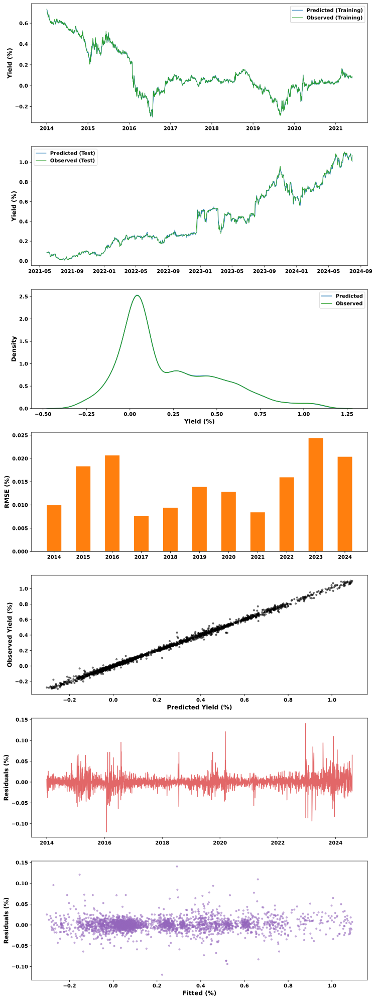

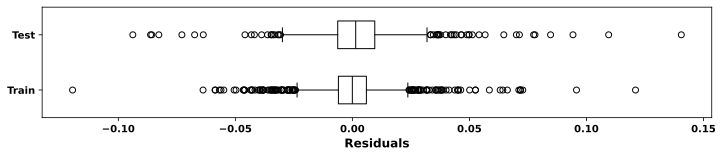

,Test,Train
MSE,0.0004,0.0002
RSE,0.0039,0.0038
MAE,0.0121,0.0089
RAE,0.0469,0.0494
sMAPE,4.8372,17.8757
RMSE,0.0187,0.0138
TS,170.9697,0.0000
Adj R^2,0.9961,0.9962
AIC,-6580.3036,-16534.0935
BIC,-6566.1465,-16517.3961


In [124]:
eval_reg(y_test_reg, y_test_ols_reg, y_train_reg, y_train_ols_reg)

### 6.5 Recursive Feature Elimination
<a id="subsection-65"></a>

In [125]:
def display_best_fit(grid_search_cv) :
    """
    Arguments :
    - grid_search_cv : fitted GridSearchCV on training data 
    
    Returns :
    - None 
    
    Function :
    - Retrieves the cross validation results dictionary and converts to a DataFrame 
    - Extract the cross validation results of the top ranked fit 
    - Prints the values of params, mean_fit_time, and mean_test_score of the top ranked fit 
    """
    results = pd.DataFrame(grid_search_cv.cv_results_)
    best_result = results.loc[results["rank_test_score"] == 1, ["params","mean_fit_time" , "mean_test_score"]].copy( )
    
    for col in best_result.columns :
        print(f"{col} : {best_result[col].values[0]}")

In [126]:
def fit_rfe(Y_train, X_train_s_df, Y_test, X_test_s_df, score = "neg_root_mean_squared_error") :
    """
    Arguments :
    - Y_train : Series for the observed response variable values in the training set 
    - X_train_s_df : DataFrame for the standardized explanatory variables' values in the training set 
    - Y_test : Series for the observed response variable values in the test set  
    - X_test_s_df : DataFrame for the standardized explanatory variables' values in the test set 
    - score : str for the scoring metric to maximize using GridSearch Cross Validation 
    
    Returns :
    - Y_train_pred : Series for the predicted response variable values in the training set 
    - Y_test_pred : Series for the predicted response variable values in the test set 
    
    Function :
    - Conducts recursive feature elimination using GridSearch Time Series CV to select the number of features to keep / drop
    """
    ols_reg = linear_model.LinearRegression( )
    rfe = feature_selection.RFE(ols_reg)
    
    ts_cv = model_selection.TimeSeriesSplit(n_splits = 8)
    params_rfe = {"n_features_to_select" : list(range(1, X_train_s_df.shape[1] + 1))} 
    
    grid_search_rfe = model_selection.GridSearchCV(rfe, params_rfe, scoring = score, 
                                                   n_jobs = - 1, cv = ts_cv, verbose = 2)
    grid_search_rfe.fit(X_train_s_df, Y_train)
    optimal_rfe = grid_search_rfe.best_estimator_
    
    print("")
    display_best_fit(grid_search_rfe)
    
    feat_select = pd.Series(optimal_rfe.support_, index = X_train_s_df.columns)
    
    plt.figure(figsize = (12, 7))
    plt.plot(feat_select, marker = "o")
    plt.title("Recursive Feature Elimination", fontsize = 12, c = "red")
    plt.ylabel("Feature Used?", fontsize = 12)
    plt.yticks([0, 1])
    plt.show( )
    
    Y_train_pred = pd.Series(optimal_rfe.predict(X_train_s_df), index = Y_train.index)
    Y_test_pred = pd.Series(optimal_rfe.predict(X_test_s_df), index = Y_test.index)
    
    return Y_train_pred, Y_test_pred 

Fitting 8 folds for each of 7 candidates, totalling 56 fits

params : {'n_features_to_select': 2}
mean_fit_time : 0.017984390258789062
mean_test_score : -0.01394116773565076


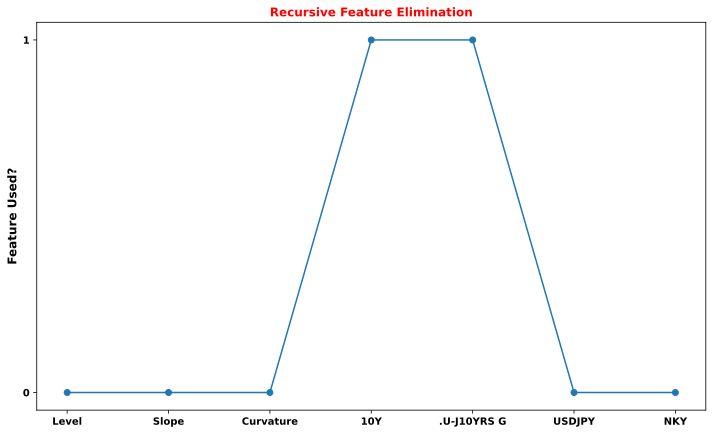

In [127]:
y_train_rfe_reg, y_test_rfe_reg = fit_rfe(y_train_reg, X_train_s, y_test_reg, X_test_s)

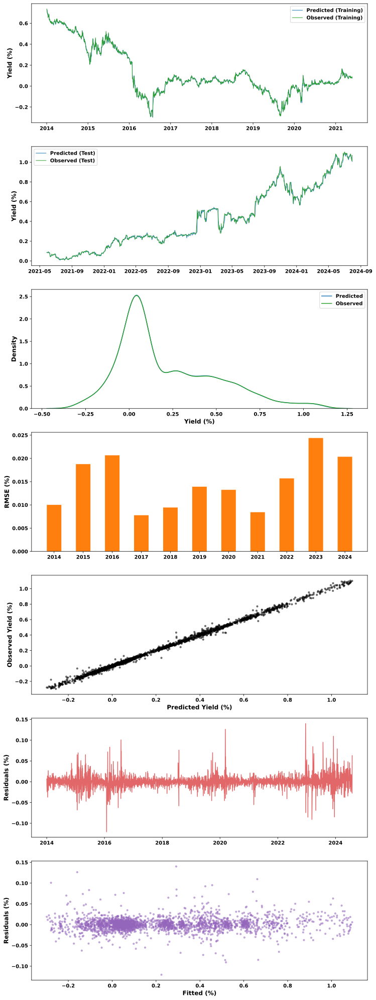

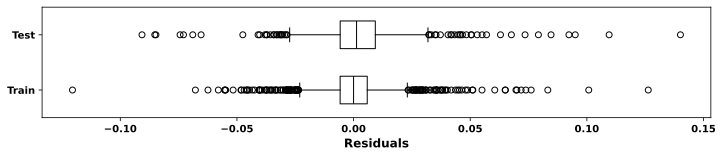

,Test,Train
MSE,0.0003,0.0002
RSE,0.0038,0.0039
MAE,0.0119,0.0090
RAE,0.0462,0.0497
sMAPE,4.8439,17.8055
RMSE,0.0187,0.0140
TS,167.0582,0.0000
Adj R^2,0.9962,0.9961
AIC,-6585.7012,-16488.9919
BIC,-6571.5442,-16472.2945


In [128]:
eval_reg(y_test_reg, y_test_rfe_reg, y_train_reg, y_train_rfe_reg)

### 6.6 L2 & L1 Regularization 
<a id="subsection-66"></a>

$$L(\beta) = \frac{1}{2} \sum_{i=1}^{n} (y_i - X_i \beta)^2 + \lambda \sum_{j=1}^{p} |\beta_j|$$

$\text{Where :}$
- $ n \text{ is the number of observations.} $
- $ y_i \text{ is the observed value for the $i$-th observation.} $
- $\lambda \text{ is the regularization parameter that controls the strength of the penalty.} $
- $ p \text{ is the number of features.} $
- $ \beta_j \text{ is the $j$-th coefficient.} $

In [129]:
alphas_l2 = [1e-4, 25e-5, 5e-4, 75e-5, 1e-3, 25e-4, 5e-3, 75e-4, 1e-2, 25e-3, 5e-2, 75e-3, 0.1, 0.25, 0.5, 0.75, 1.0, 2.5, 5.0]

In [130]:
def fit_ridge(Y_train, X_train_s_df, Y_test, X_test_s_df, alphas, score = "neg_root_mean_squared_error") :
    """
    Arguments :
    - Y_train : Series for the observed response variable values in the training set 
    - X_train_s_df : DataFrame for the standardized explanatory variables' values in the training set 
    - Y_test : Series for the observed response variable values in the test set  
    - X_test_s_df : DataFrame for the standardized explanatory variables' values in the test set 
    - alphas : list of float for the regularization parameter candidates 
    - score : str for the scoring metric to maximize using GridSearch Cross Validation 
    
    Returns :
    - Y_train_pred : Series for the predicted response variable values in the training set 
    - Y_test_pred : Series for the predicted response variable values in the test set 
    
    Function :
    - Fits Ridge Regression using GridSearch Time Series CV to select the optimal value for the regularization parameter  
    """
    ridge = linear_model.Ridge(random_state = rs)
    
    ts_cv = model_selection.TimeSeriesSplit(n_splits = 8)
    params_ridge = {"alpha" : alphas} 

    grid_search_ridge = model_selection.GridSearchCV(ridge, params_ridge,scoring = score, n_jobs = -1, cv = ts_cv, verbose = 2)
    grid_search_ridge.fit(X_train_s_df, Y_train)
    optimal_ridge = grid_search_ridge.best_estimator_
    
    print("")
    display_best_fit(grid_search_ridge)
    
    feature_coefs = pd.Series(optimal_ridge.coef_, index = X_train_s_df.columns).sort_values(ascending = True)

    plt.figure(figsize = (12, 7))
    plt.plot(feature_coefs, marker = "o")
    plt.title("Ridge Regression", fontsize = 12, c = "red")
    plt.ylabel("Feature Coefficient", fontsize = 12)
    plt.show( )
    
    Y_train_pred = pd.Series(optimal_ridge.predict(X_train_s_df), index = Y_train.index)
    Y_test_pred = pd.Series(optimal_ridge.predict(X_test_s_df), index = Y_test.index)
    
    return Y_train_pred, Y_test_pred 

Fitting 8 folds for each of 19 candidates, totalling 152 fits

params : {'alpha': 0.0001}
mean_fit_time : 0.002568662166595459
mean_test_score : -0.014045269987417194


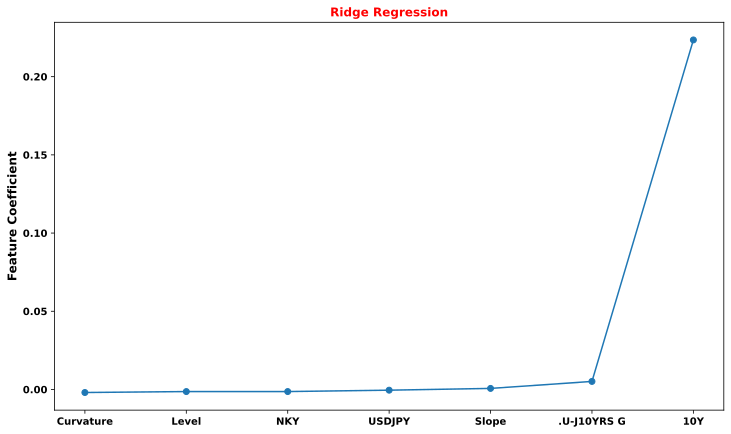

In [131]:
y_train_ridge_reg, y_test_ridge_reg = fit_ridge(y_train_reg, X_train_s, y_test_reg, X_test_s, alphas_l2)

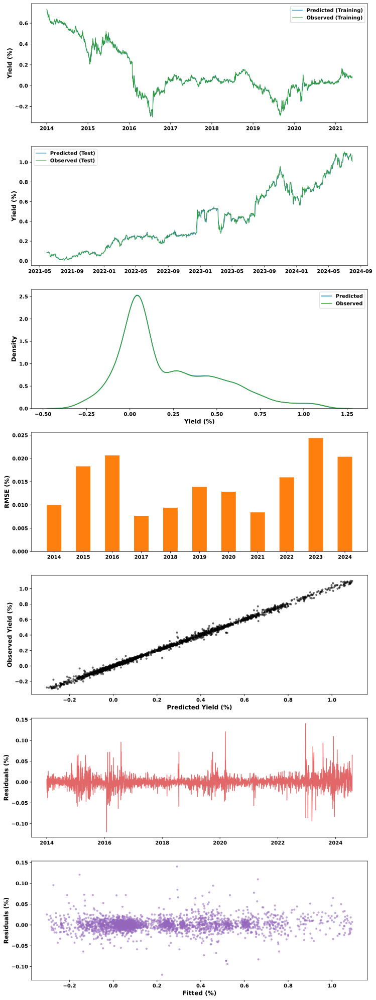

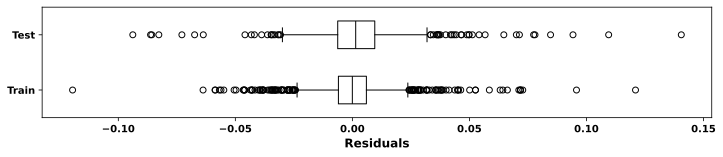

,Test,Train
MSE,0.0004,0.0002
RSE,0.0039,0.0038
MAE,0.0121,0.0089
RAE,0.0469,0.0494
sMAPE,4.8372,17.8757
RMSE,0.0187,0.0138
TS,170.9707,0.0000
Adj R^2,0.9961,0.9962
AIC,-6580.3033,-16534.0935
BIC,-6566.1462,-16517.3961


In [132]:
eval_reg(y_test_reg, y_test_ridge_reg, y_train_reg, y_train_ridge_reg)

$$L(\beta) = \frac{1}{2} \sum_{i=1}^{n} (y_i - X_i \beta)^2 + \lambda \sum_{j=1}^{p} \beta_j^2$$

$\text{Where :}$
- $ n \text{ is the number of observations.} $
- $ y_i \text{ is the observed value for the $i$-th observation.} $
- $\lambda \text{ is the regularization parameter that controls the strength of the penalty.} $
- $ p \text{ is the number of features.} $
- $ \beta_j \text{ is the $j$-th coefficient.} $

In [133]:
alphas_l1 = [1e-4, 25e-5, 5e-4, 75e-5, 1e-3, 25e-4, 5e-3, 75e-4, 1e-2, 25e-3, 5e-2, 75e-3, 0.1, 0.25, 0.5, 0.75, 1.0, 2.5, 5.0]

In [134]:
def fit_lasso(Y_train, X_train_s_df, Y_test, X_test_s_df, alphas, score = "neg_root_mean_squared_error") :
    """
    Arguments :
    - Y_train : Series for the observed response variable values in the training set 
    - X_train_s_df : DataFrame for the standardized explanatory variables' values in the training set 
    - Y_test : Series for the observed response variable values in the test set  
    - X_test_s_df : DataFrame for the standardized explanatory variables' values in the test set 
    - alphas : list of float for the regularization parameter candidates 
    - score : str for the scoring metric to maximize using GridSearch Cross Validation 
    
    Returns :
    - Y_train_pred : Series for the predicted response variable values in the training set 
    - Y_test_pred : Series for the predicted response variable values in the test set 
    
    Function :
    - Fits Lasso Regression using GridSearch Time Series CV to select the optimal value for the regularization parameter 
    """
    lasso = linear_model.Lasso(random_state = rs)
    
    ts_cv = model_selection.TimeSeriesSplit(n_splits = 8)
    params_lasso = {"alpha" : alphas} 

    grid_search_lasso = model_selection.GridSearchCV(lasso, params_lasso, scoring = score, n_jobs = -1, cv = ts_cv, verbose = 2)
    grid_search_lasso.fit(X_train_s_df, Y_train)
    optimal_lasso = grid_search_lasso.best_estimator_
    
    print("")
    display_best_fit(grid_search_lasso)
    
    feats_coefs = pd.Series(optimal_lasso.coef_, index = X_train_s_df.columns).sort_values(ascending = True)
    
    plt.figure(figsize = (12, 7))
    plt.plot(feats_coefs, marker = "o")
    plt.title("Lasso Regression", fontsize = 12, c = "red")
    plt.ylabel("Feature Coefficient", fontsize = 12)
    plt.show( )
    
    Y_train_pred = pd.Series(optimal_lasso.predict(X_train_s_df), index = Y_train.index)
    Y_test_pred = pd.Series(optimal_lasso.predict(X_test_s_df), index = Y_test.index)
    
    return Y_train_pred, Y_test_pred 

Fitting 8 folds for each of 19 candidates, totalling 152 fits

params : {'alpha': 0.0001}
mean_fit_time : 0.0014175474643707275
mean_test_score : -0.014079733124842727


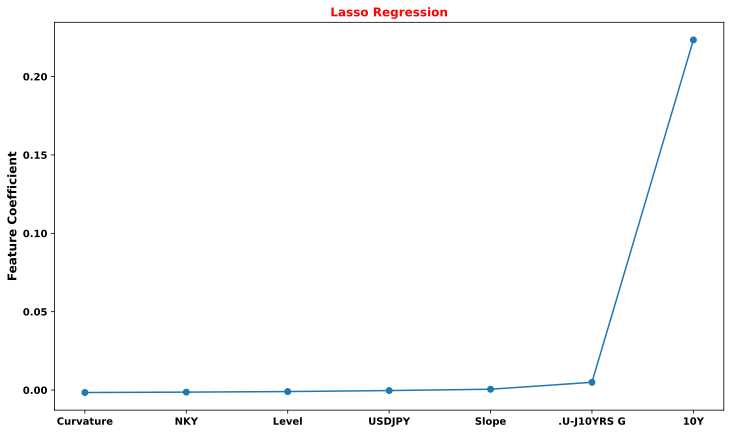

In [135]:
y_train_lasso_reg, y_test_lasso_reg = fit_lasso(y_train_reg, X_train_s, y_test_reg, X_test_s, alphas_l1)

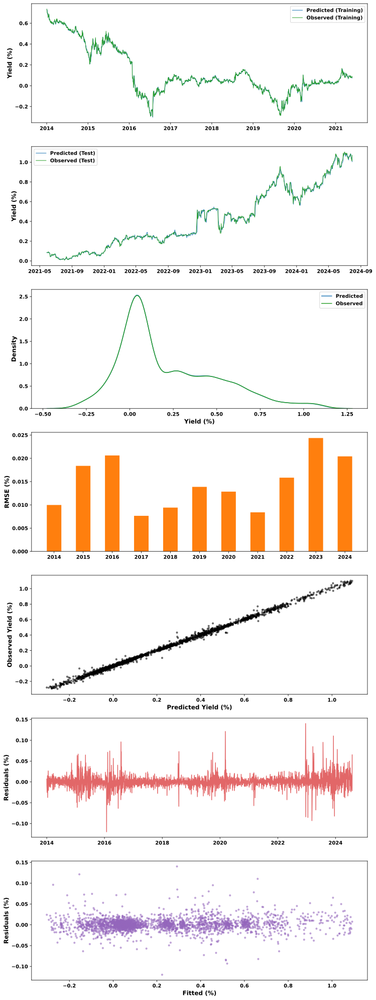

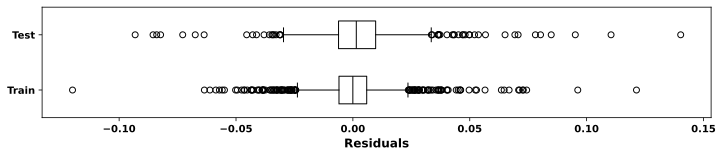

,Test,Train
MSE,0.0004,0.0002
RSE,0.0038,0.0038
MAE,0.0121,0.0089
RAE,0.0467,0.0493
sMAPE,4.8123,17.7898
RMSE,0.0187,0.0138
TS,179.2807,0.0000
Adj R^2,0.9961,0.9962
AIC,-6582.4276,-16532.6273
BIC,-6568.2706,-16515.9299


In [136]:
eval_reg(y_test_reg, y_test_lasso_reg, y_train_reg, y_train_lasso_reg)

$$L(\beta) = \frac{1}{2} \sum_{i=1}^{n} (y_i - X_i \beta)^2 + \lambda_1 \sum_{j=1}^{p} |\beta_j| + \lambda_2 \sum_{j=1}^{p} \beta_j^2$$

$\text{Where :}$
- $ n \text{ is the number of observations.} $
- $ y_i \text{ is the observed value for the $i$-th observation.} $
- $ \lambda_1 \text{ is the regularization parameter for the L1 penalty.} $
- $ \lambda_2 \text{ is the regularization parameter for the L2 penalty.} $
- $ p \text{ is the number of features.} $
- $ \beta_j \text{ is the $j$-th coefficient.} $

In [137]:
alphas_l1l2 = [1e-4, 25e-5, 5e-4, 75e-5, 1e-3, 25e-4, 5e-3, 75e-4, 1e-2, 25e-3, 5e-2, 75e-3, 0.1, 0.25, 0.5, 0.75, 1.0, 2.5, 5.0]

In [138]:
def fit_elnet(Y_train, X_train_s_df, Y_test, X_test_s_df, alphas, score = "neg_root_mean_squared_error") :
    """
    Arguments :
    - Y_train : Series for the observed response variable values in the training set 
    - X_train_s_df : DataFrame for the standardized explanatory variables' values in the training set 
    - Y_test : Series for the observed response variable values in the test set  
    - X_test_s_df : DataFrame for the standardized explanatory variables' values in the test set 
    - alphas : list of float for the regularization parameter candidates 
    - score : str for the scoring metric to maximize using GridSearch Cross Validation 
    
    Returns :
    - Y_train_pred : Series for the predicted response variable values in the training set 
    - Y_test_pred : Series for the predicted response variable values in the test set 
    
    Function :
    - Fits Elastic Net Regression using GridSearch Time Series CV to select the optimal value for the regularization parameter 
    """
    elnet = linear_model.ElasticNet(random_state = rs)
    
    ts_cv = model_selection.TimeSeriesSplit(n_splits = 8)
    params_elnet = {"alpha" : alphas, "l1_ratio" : alphas} 
    
    grid_search_elnet = model_selection.GridSearchCV(elnet, params_elnet, scoring = score, n_jobs = -1, cv = ts_cv, verbose = 2)
    grid_search_elnet.fit(X_train_s_df, Y_train)
    optimal_elnet = grid_search_elnet.best_estimator_
    
    print("")
    display_best_fit(grid_search_elnet)
    
    feats_coefs = pd.Series(optimal_elnet.coef_, index = X_train_s_df.columns).sort_values(ascending = True)
    
    plt.figure(figsize = (12, 7))
    plt.plot(feats_coefs, marker = "o")
    plt.title("Elastic Net Regression", fontsize = 12, c = "red")
    plt.ylabel("Feature Coefficient", fontsize = 12)
    plt.show( )
    
    Y_train_pred = pd.Series(optimal_elnet.predict(X_train_s_df), index = Y_train.index)
    Y_test_pred = pd.Series(optimal_elnet.predict(X_test_s_df), index = Y_test.index)
    
    return Y_train_pred, Y_test_pred 

Fitting 8 folds for each of 361 candidates, totalling 2888 fits

params : {'alpha': 0.0001, 'l1_ratio': 0.0001}
mean_fit_time : 0.001826554536819458
mean_test_score : -0.014052154761816472


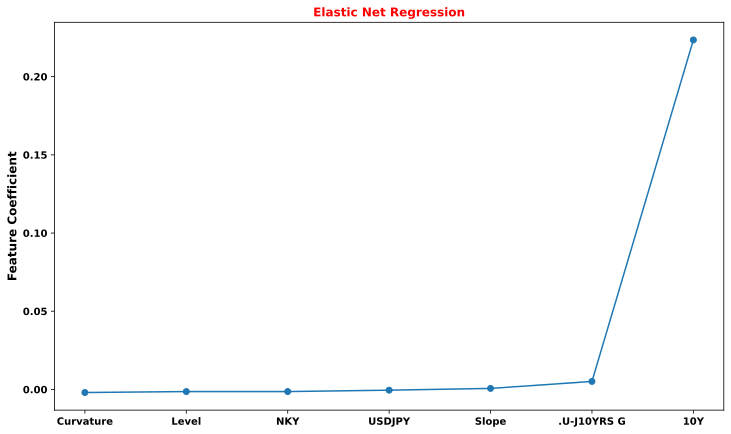

In [139]:
y_train_elnet_reg, y_test_elnet_reg = fit_elnet(y_train_reg, X_train_s, y_test_reg, X_test_s, alphas_l1l2)

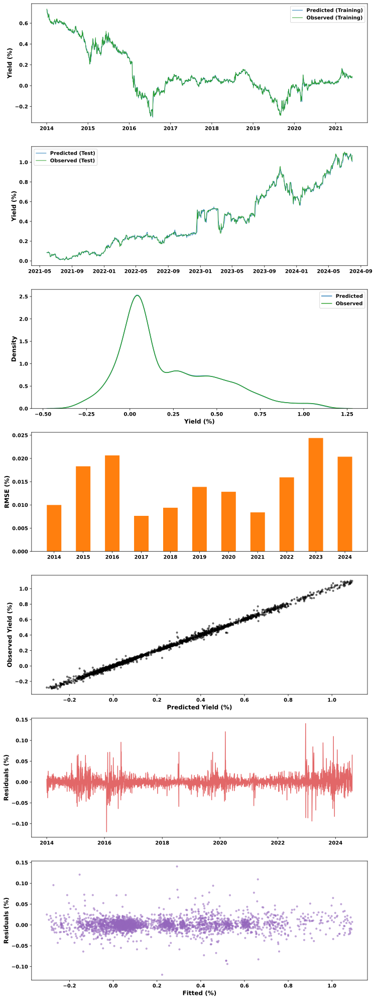

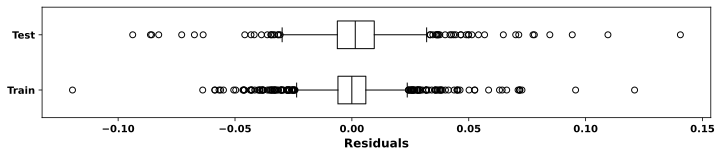

,Test,Train
MSE,0.0004,0.0002
RSE,0.0039,0.0038
MAE,0.0121,0.0089
RAE,0.0469,0.0495
sMAPE,4.8372,17.8740
RMSE,0.0187,0.0138
TS,172.8949,0.0000
Adj R^2,0.9961,0.9962
AIC,-6579.7582,-16534.0884
BIC,-6565.6012,-16517.3910


In [140]:
eval_reg(y_test_reg, y_test_elnet_reg, y_train_reg, y_train_elnet_reg)

# Author 
[Khai Lap Vuong](https://www.linkedin.com/in/khai-lap-vuong/)